### Predicting Wine Quality Project

In this project, our aim is to building a model for predicting wine qualities. Our label will be `quality` column. Do not forget, this is a Classification problem!

## Steps
- Read the `winequality.csv` file and describe it.
- Make at least 4 different analysis on Exploratory Data Analysis section.
- Pre-process the dataset to get ready for ML application. (Check missing data and handle them, can we need to do scaling or feature extraction etc.)
- Define appropriate evaluation metric for our case (classification).
- Train and evaluate Decision Trees and at least 2 different appropriate algorithm which you can choose from scikit-learn library.
- Is there any overfitting and underfitting? Interpret your results and try to overcome if there is any problem in a new section.
- Create confusion metrics for each algorithm and display Accuracy, Recall, Precision and F1-Score values.
- Analyse and compare results of 3 algorithms.
- Select best performing model based on evaluation metric you chose on test dataset.


Good luck :)

<h2>Izuogu Chibuzor Godson</h2>

## Importing Data

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from pandas_profiling.profile_report import ProfileReport
import warnings; warnings.filterwarnings('ignore')

%matplotlib inline

In [3]:
Data = pd.read_csv("winequality.csv")

In [4]:
Data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [7]:
ProfileReport(Data, explorative=True, dark_mode=True, sensitive = True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
rows, columns = Data.shape
print(f'rows: {rows}, columns:{columns}')

rows: 1599, columns:12


In [15]:
Data.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [17]:
len(Data['residual sugar'].unique())

91

In [18]:
for column in Data.columns:
    print(f'column has {len(column.unique())} unique values')

AttributeError: 'str' object has no attribute 'unique'

In [12]:
Data["quality"].unique().sum()

33

In [8]:
# Describe our data for each feature and use .info() for get information about our dataset
# Analyse missing values
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [9]:
Data.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

# Exploratory Data Analysis

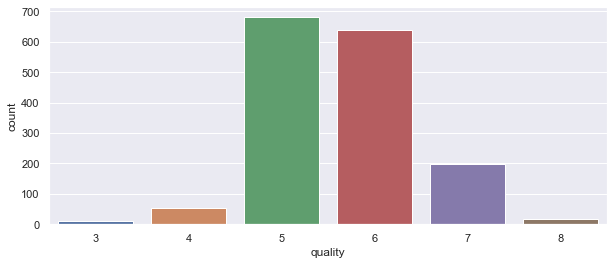

In [15]:
# Our label Distribution (countplot)
sns.countplot(x = 'quality', data = Data);

In [16]:
Data.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

C:\Users\Chibuzor\.conda\envs\Tensor_Flow\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

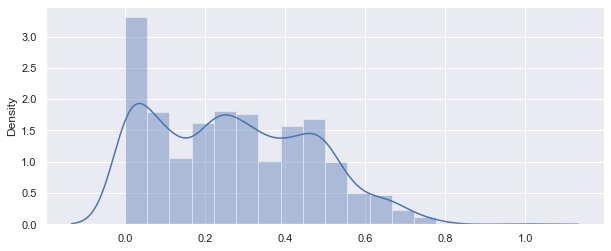

In [24]:
# Example EDA (distplot)
sns.distplot(x = Data["citric acid"])

# Preprocessing

- Are there any duplicated values?
- Do we need to do feature scaling?
- Do we need to generate new features?
- Split Train and Test dataset. (0.7/0.3)

In [28]:
X = Data.drop(["quality"], axis="columns")
y = Data.quality

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state = randomState)

# ML Application

- Define models.
- Fit models.
- Evaluate models for both train and test dataset.
- Generate Confusion Matrix and scores of Accuracy, Recall, Precision and F1-Score.
- Analyse occurrence of overfitting and underfitting. If there is any of them, try to overcome it within a different section.

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier 
from sklearn.tree import DecisionTreeClassifier

In [53]:
categorical_features_indices = np.where(X.dtypes != np.float)[0]

In [54]:
model = CatBoostClassifier(iterations=1000, depth =7, learning_rate=0.123, eval_metric="Accuracy")

In [55]:
model.fit(X_train,y_train,cat_features=categorical_features_indices,eval_set=(X_test,y_test),plot=True)

0:	learn: 0.5835567	test: 0.5062500	best: 0.5062500 (0)	total: 2s	remaining: 33m 14s
1:	learn: 0.5808758	test: 0.5250000	best: 0.5250000 (1)	total: 2.03s	remaining: 16m 51s
2:	learn: 0.6032172	test: 0.5375000	best: 0.5375000 (2)	total: 2.09s	remaining: 11m 36s
3:	learn: 0.6076854	test: 0.5437500	best: 0.5437500 (3)	total: 2.17s	remaining: 8m 59s
4:	learn: 0.6050045	test: 0.5562500	best: 0.5562500 (4)	total: 2.17s	remaining: 7m 12s
5:	learn: 0.6085791	test: 0.5708333	best: 0.5708333 (5)	total: 2.25s	remaining: 6m 12s
6:	learn: 0.6112601	test: 0.5604167	best: 0.5708333 (5)	total: 2.36s	remaining: 5m 35s
7:	learn: 0.6166220	test: 0.5625000	best: 0.5708333 (5)	total: 2.54s	remaining: 5m 14s
8:	learn: 0.6166220	test: 0.5645833	best: 0.5708333 (5)	total: 2.57s	remaining: 4m 42s
9:	learn: 0.6255585	test: 0.5666667	best: 0.5708333 (5)	total: 2.68s	remaining: 4m 25s
10:	learn: 0.6336014	test: 0.5729167	best: 0.5729167 (10)	total: 2.87s	remaining: 4m 18s
11:	learn: 0.6389634	test: 0.5812500	best

58:	learn: 0.7596068	test: 0.6291667	best: 0.6312500 (57)	total: 7.19s	remaining: 1m 54s
59:	learn: 0.7631814	test: 0.6250000	best: 0.6312500 (57)	total: 7.39s	remaining: 1m 55s


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

60:	learn: 0.7667560	test: 0.6208333	best: 0.6312500 (57)	total: 7.56s	remaining: 1m 56s
61:	learn: 0.7667560	test: 0.6250000	best: 0.6312500 (57)	total: 7.64s	remaining: 1m 55s
62:	learn: 0.7667560	test: 0.6208333	best: 0.6312500 (57)	total: 7.72s	remaining: 1m 54s
63:	learn: 0.7649687	test: 0.6187500	best: 0.6312500 (57)	total: 7.88s	remaining: 1m 55s
64:	learn: 0.7685433	test: 0.6166667	best: 0.6312500 (57)	total: 7.91s	remaining: 1m 53s
65:	learn: 0.7730116	test: 0.6145833	best: 0.6312500 (57)	total: 8s	remaining: 1m 53s
66:	learn: 0.7756926	test: 0.6250000	best: 0.6312500 (57)	total: 8.17s	remaining: 1m 53s
67:	learn: 0.7765862	test: 0.6250000	best: 0.6312500 (57)	total: 8.26s	remaining: 1m 53s
68:	learn: 0.7810545	test: 0.6270833	best: 0.6312500 (57)	total: 8.29s	remaining: 1m 51s
69:	learn: 0.7837355	test: 0.6229167	best: 0.6312500 (57)	total: 8.38s	remaining: 1m 51s
70:	learn: 0.7828418	test: 0.6250000	best: 0.6312500 (57)	total: 8.47s	remaining: 1m 50s
71:	learn: 0.7882038	tes

In [56]:
model.score(X_test, y_test)

0.6833333333333333

In [57]:
with open("bangalore_home_prices_model", "wb") as f:
    pickle.dump(model, f)

In [ ]:
model.predict()

In [2]:
from sklearn.model_selection import GridSearchCV
#Try other models to figure out which one gives the best score
#We now write a function

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        "logistic_Regression":{
            "model":LogisticRegression(),
            "params":{
                "penalty":l2
               # "max_iter" :1000
                #"n_jobs":4
            }
        },
        
        "random_forest": {
            "model": RandomForestClassifier(),
            "params": {
                 "n_estimators":100*
                 #"criterion":gini
                 #"max_depth":1000
                 #"n_jobs":4
                
            }
        },
        
        "decision_tree": {
            "model": DecisionClassifier(),
            "params": {
            "criterion":gini
            "splitter":best
            "max_depth":1000
            "n_jobs":4
               
            }
        }
    }
    
    #To save the model into a dataframe
    
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs = GridSearchCV(config["model"], config["params"], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            "model":algo_name,
            "best_score":gs.best_score_,
            "best_params":gs.best_params_
        })
        
    return pd.DataFrame(scores, columns=["model","best_score", "best_params"])

# Calling the model

find_best_model_using_gridsearchcv(X,y)

SyntaxError: invalid syntax (Temp/ipykernel_6324/2017906548.py, line 24)

# Evaluation

- Select the best performing model and write your comments about why choose this model.
- Analyse results and make comment about how you can improve model.

In [ ]:
import pickle